# Data Science & Business Analytics 

### Prediction Using Decision Tree Algorithm

### 1.Importing libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sn
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as py
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
iris = pd.read_csv('Iris.csv')
iris.head()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa


In [3]:
iris.isnull().sum()

Id               0
SepalLengthCm    0
SepalWidthCm     0
PetalLengthCm    0
PetalWidthCm     0
Species          0
dtype: int64

In [4]:
iris['Species'].unique()

array(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], dtype=object)

In [5]:
def splitkeyword(string):
    string = string.split('-')
    return string[1]

iris['Species'] = iris['Species'].apply(lambda x:splitkeyword(x))
iris.head()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,setosa
1,2,4.9,3.0,1.4,0.2,setosa
2,3,4.7,3.2,1.3,0.2,setosa
3,4,4.6,3.1,1.5,0.2,setosa
4,5,5.0,3.6,1.4,0.2,setosa


In [6]:
### Creating a mapper for the Species,as for classification we need numerical data!==>

species_list = list(iris['Species'].unique())
mapper = {species_list[i]:i+1 for i in range(len(species_list))}
mapper

{'setosa': 1, 'versicolor': 2, 'virginica': 3}

In [7]:
iris['Class'] = iris['Species'].map(mapper)
iris.head()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species,Class
0,1,5.1,3.5,1.4,0.2,setosa,1
1,2,4.9,3.0,1.4,0.2,setosa,1
2,3,4.7,3.2,1.3,0.2,setosa,1
3,4,4.6,3.1,1.5,0.2,setosa,1
4,5,5.0,3.6,1.4,0.2,setosa,1


In [8]:
iris['Class'].value_counts()


1    50
2    50
3    50
Name: Class, dtype: int64

In [9]:
# sn.countplot(iris['Class'],palette='plasma')

In [10]:
## dropping the id column

iris = iris.drop(['Id'],axis=1)
iris.head()

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species,Class
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


In [11]:
# For now i will be dropping the species column,as we're about to start the model building
# once i get the predicted results,i will remap the Actual species and Predicted Species.

species = list(iris['Species'])
iris = iris.drop(['Species'],axis = 1)
iris.head()

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Class
0,5.1,3.5,1.4,0.2,1
1,4.9,3.0,1.4,0.2,1
2,4.7,3.2,1.3,0.2,1
3,4.6,3.1,1.5,0.2,1
4,5.0,3.6,1.4,0.2,1


In [12]:
# If we make an observation here,the Class Feature is in continous order,i.e the values are not jumbled
# First 50 rows are of class 1,next 50 are of class 2,and next 50 are of class 3,so its in an order we can say
# When we're working on Tree based Classifiers,they generally try to predict all the classes perfectly!,
# We cannot know how the model has performed,so a kind of Shuffling must be done,so that the model can get some unordered
# Data in its way and then we can get the correct intuation of this!,so i'll be using the sample(frac = 1) of pandas
# frac = 1 means we're trying to shuffle the data row wise.

iris = iris.sample(frac=1).reset_index()
iris = iris.drop(['index'],axis = 1)
iris.head()

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Class
0,5.8,2.8,5.1,2.4,3
1,4.5,2.3,1.3,0.3,1
2,6.1,2.8,4.0,1.3,2
3,7.2,3.2,6.0,1.8,3
4,5.5,2.5,4.0,1.3,2


In [13]:
## renaming the column names

iris.columns = ['SepalLength','SepalWidth','PetalLength','PetalWidth','Class']
iris.head(3)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Class
0,5.8,2.8,5.1,2.4,3
1,4.5,2.3,1.3,0.3,1
2,6.1,2.8,4.0,1.3,2


In [14]:
## Splitting the data into training and testing

test = iris['Class']
train = iris.drop(['Class'],axis = 1)
train.head(2)

,SepalLength,SepalWidth,PetalLength,PetalWidth
0,5.8,2.8,5.1,2.4
1,4.5,2.3,1.3,0.3


## 2.Distribution Analysis

In [15]:
import scipy.stats as stats

In [16]:
def makeplots(col):
    
    plt.figure(figsize=(15,7))
    plt.subplot(1,3,1)
    plt.hist(iris[col],color='salmon')
    
    plt.subplot(1,3,2)
    stats.probplot(iris[col],dist='norm',plot=plt)
    
    
    plt.subplot(1,3,3)
    sn.boxplot(iris[col],color='pink')
    plt.show()
    
    

 Statistical Plots for the Feature : SepalLength are shown ↓


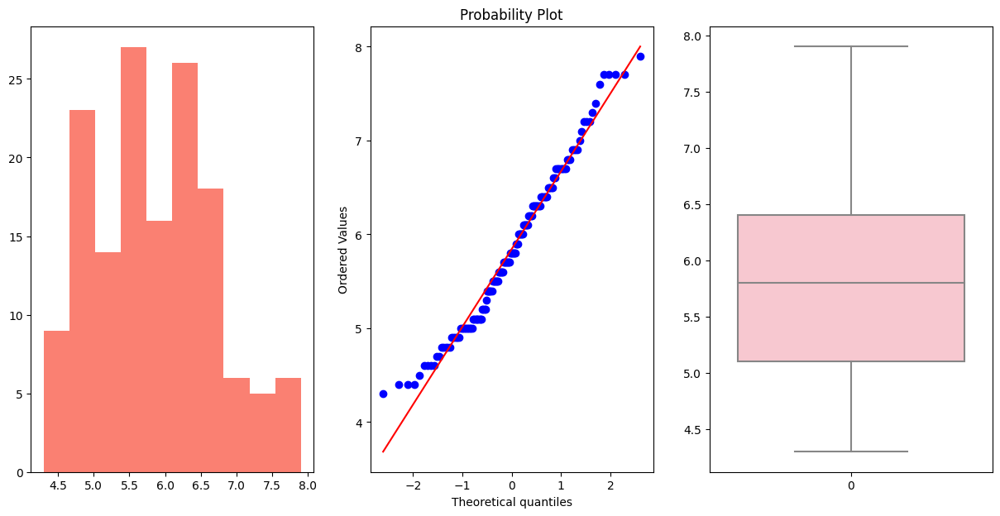

---------------------------------------------------------------------------
 Statistical Plots for the Feature : SepalWidth are shown ↓


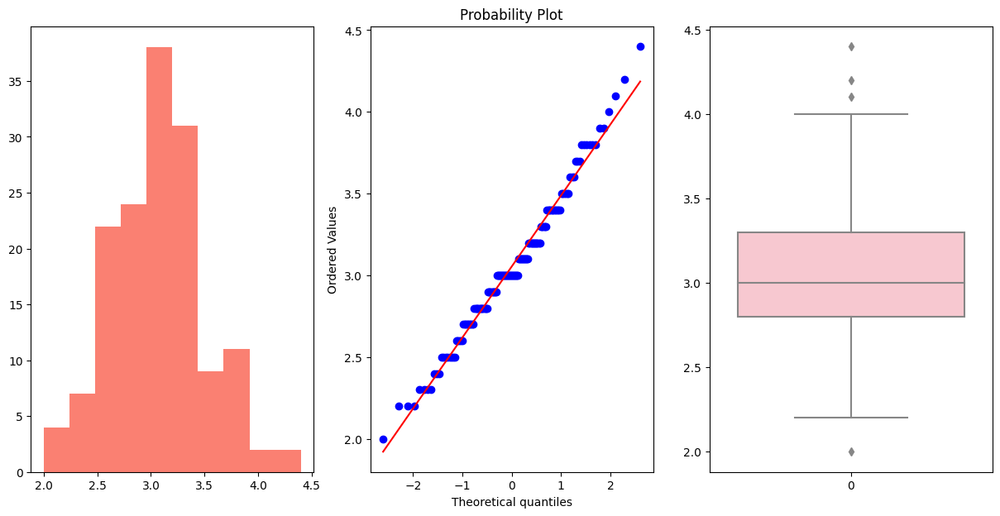

---------------------------------------------------------------------------
 Statistical Plots for the Feature : PetalLength are shown ↓


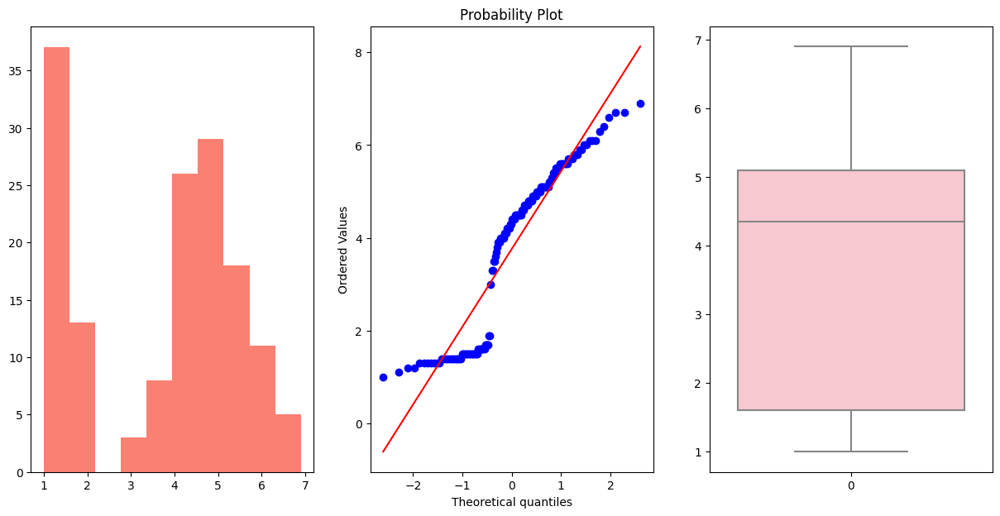

---------------------------------------------------------------------------
 Statistical Plots for the Feature : PetalWidth are shown ↓


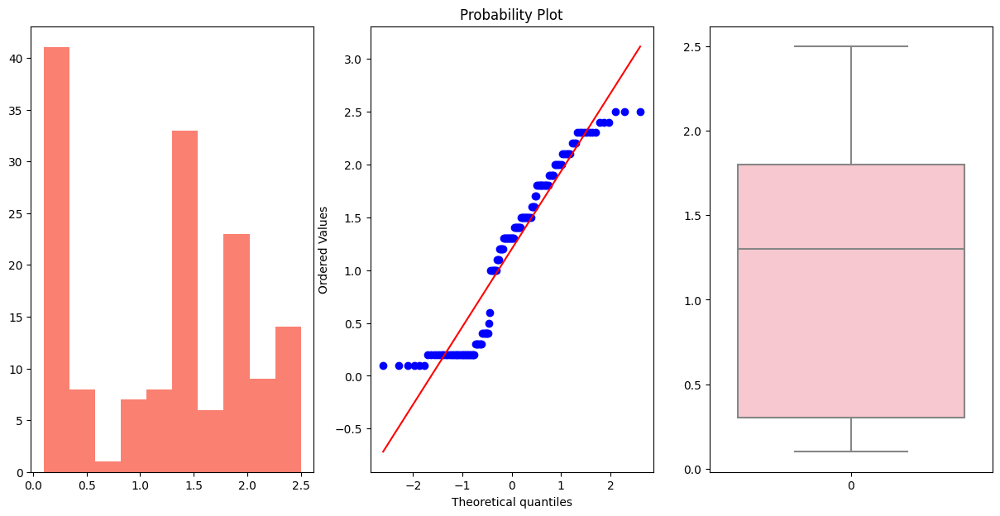

---------------------------------------------------------------------------


In [17]:
for i in train.columns:
    print(f' Statistical Plots for the Feature : {i} are shown ↓')
    makeplots(i)
    print("-"*75)

In [18]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV,train_test_split
from sklearn import tree
from sklearn import metrics

In [19]:
# Splitting the data into train and test 80% training,20% validation

X_train, X_test, y_train, y_test = train_test_split(train,test,test_size = 0.2)
X_train.shape,X_test.shape

((120, 4), (30, 4))

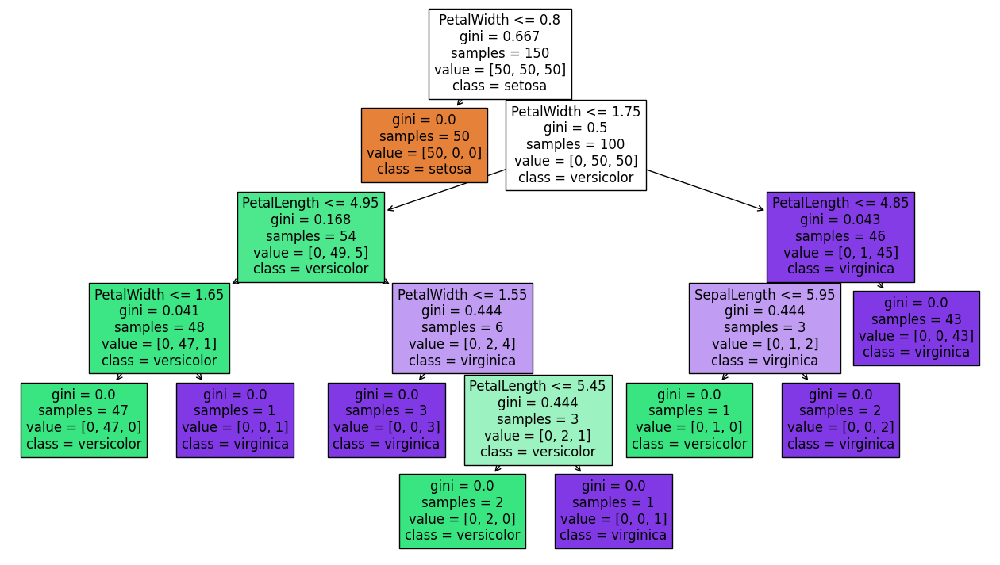

In [20]:
clf = DecisionTreeClassifier(criterion='gini')
clf.fit(train,test)
classnames=['setosa', 'versicolor', 'virginica']
plt.figure(figsize = (16,9))
tree.plot_tree(clf,filled=True,feature_names=train.columns,class_names=classnames)
plt.show()

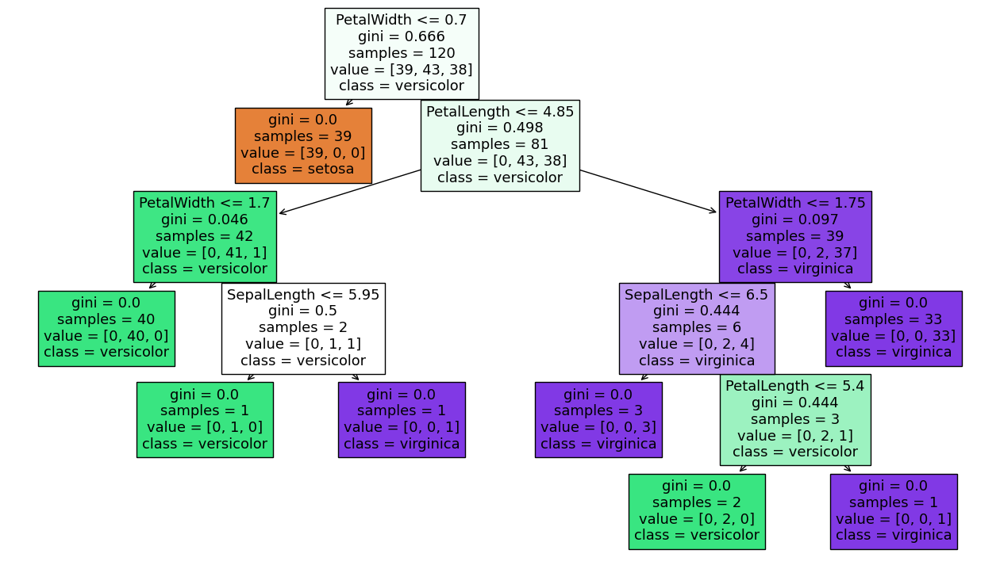

In [21]:
clf = DecisionTreeClassifier(criterion='gini')
clf.fit(X_train,y_train)
classnames=['setosa', 'versicolor', 'virginica']
plt.figure(figsize = (16,9))
tree.plot_tree(clf,filled=True,feature_names=train.columns,class_names=classnames)
plt.show()

In [22]:
path = clf.cost_complexity_pruning_path(X_train,y_train)
ccp_alphas = path.ccp_alphas

In [23]:
alpha_list = []
for i in ccp_alphas:
    clf = DecisionTreeClassifier(ccp_alpha=i)
    clf.fit(X_train,y_train)
    alpha_list.append(clf)

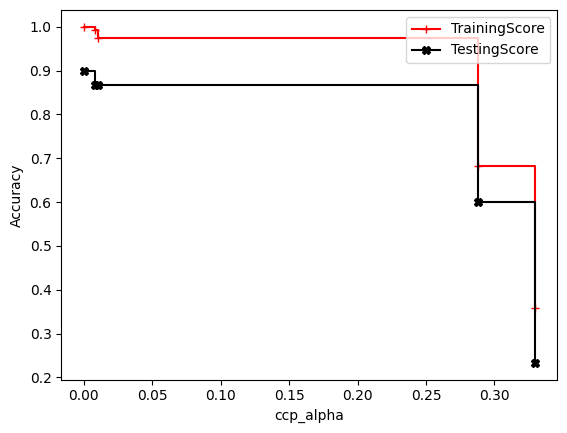

In [24]:
train_score = [clf.score(X_train,y_train) for clf in alpha_list]
test_score = [clf.score(X_test,y_test) for clf in alpha_list]
plt.plot(ccp_alphas,train_score,marker = '+',label = 'TrainingScore',
        drawstyle = "steps-post",c= 'red')
plt.plot(ccp_alphas,test_score,marker = 'X',label = 'TestingScore',
        drawstyle = "steps-post",c = 'black')
plt.xlabel('ccp_alpha')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


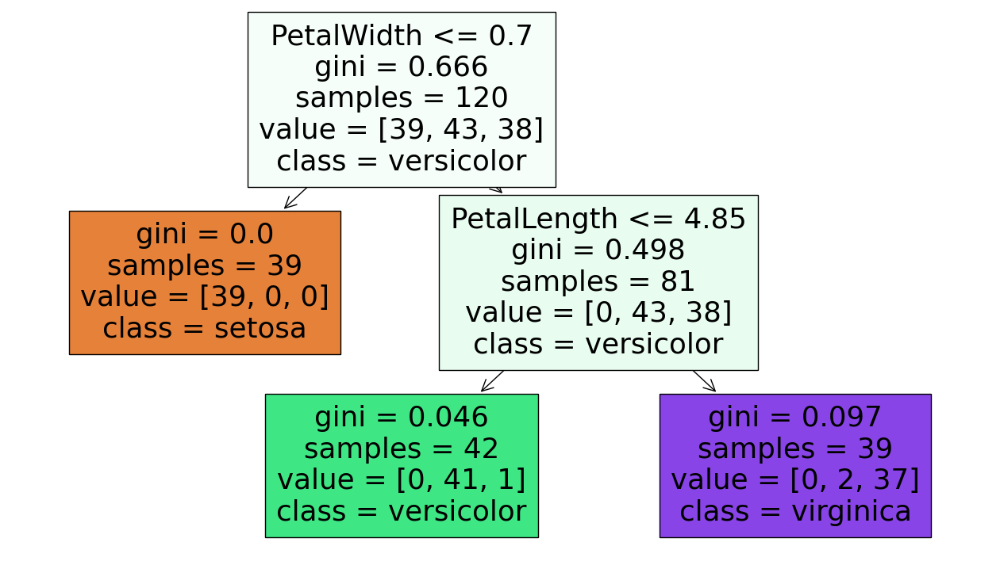

In [25]:
clf = DecisionTreeClassifier(criterion='gini',ccp_alpha=0.025)
clf.fit(X_train,y_train)
classnames=['setosa', 'versicolor', 'virginica']
plt.figure(figsize = (16,9))
tree.plot_tree(clf,filled=True,feature_names=train.columns,class_names=classnames)
plt.show()

In [26]:
iris.columns

Index(['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth', 'Class'], dtype='object')

In [27]:
sepal_data = iris[['SepalLength', 'SepalWidth']]
petal_data = iris[['PetalLength', 'PetalWidth']]
classes = iris['Class']

sp_length = sepal_data['SepalLength'].values
sp_width  = sepal_data['SepalWidth'].values
sp_array = np.c_[sp_length,sp_width]


pt_length = petal_data['PetalLength'].values
pt_width  = petal_data['PetalWidth'].values
pt_array = np.c_[pt_length,pt_width]

## 3.Decision Boundaries only for Sepal Data!!

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



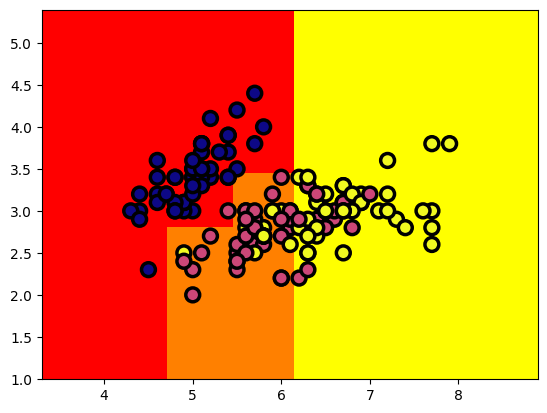

In [28]:
def getmeshgrid(data):
    
    x_min,x_max = data[:,0].min()-1,data[:,0].max()+1
    y_min,y_max = data[:,1].min()-1,data[:,1].max()+1
    
    return np.meshgrid((np.arange(x_min,x_max,0.01)),
                      (np.arange(y_min,y_max,0.01)))


clf = DecisionTreeClassifier(criterion='gini',max_depth=3)
clf.fit(sepal_data,classes)
xx,yy = getmeshgrid(sp_array)

predicted = clf.predict(np.c_[xx.ravel(),yy.ravel()]).reshape(xx.shape)
plt.pcolormesh(xx,yy,predicted,cmap='autumn')
plt.scatter(sp_array[:,0],sp_array[:,1],c = classes,
           s = 100,cmap='plasma',edgecolors='black',linewidths=2.5)

## 4.Decision Boundaries only for Petal Data

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



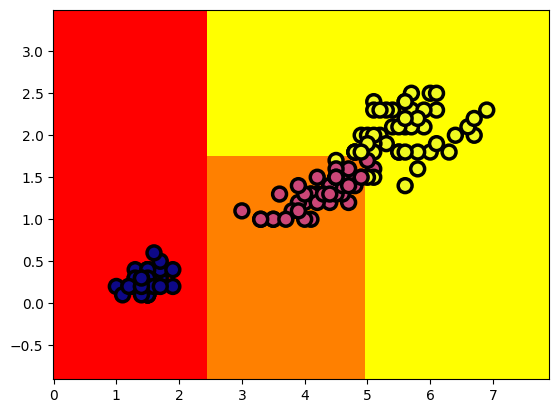

In [29]:
def getmeshgrid(data):
    
    x_min,x_max = data[:,0].min()-1,data[:,0].max()+1
    y_min,y_max = data[:,1].min()-1,data[:,1].max()+1
    
    return np.meshgrid((np.arange(x_min,x_max,0.01)),
                      (np.arange(y_min,y_max,0.01)))


clf = DecisionTreeClassifier(criterion='gini',max_depth=3)
clf.fit(petal_data,classes)
xx,yy = getmeshgrid(pt_array)

predicted = clf.predict(np.c_[xx.ravel(),yy.ravel()]).reshape(xx.shape)
plt.pcolormesh(xx,yy,predicted,cmap='autumn')
plt.scatter(pt_array[:,0],pt_array[:,1],c = classes,
           s = 100,cmap='plasma',edgecolors='black',linewidths=2.5)

## 5.Overfitting Case of only Sepal Data

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



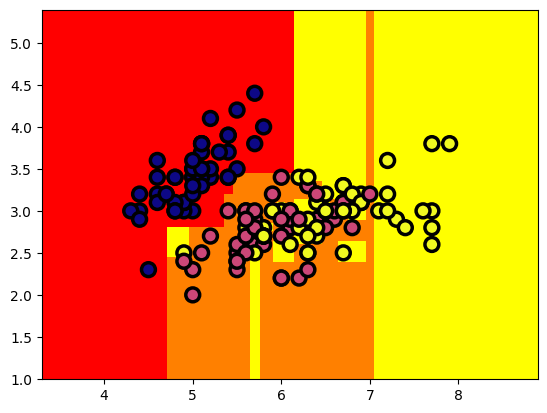

In [30]:
def getmeshgrid(data):
    
    x_min,x_max = data[:,0].min()-1,data[:,0].max()+1
    y_min,y_max = data[:,1].min()-1,data[:,1].max()+1
    
    return np.meshgrid((np.arange(x_min,x_max,0.01)),
                      (np.arange(y_min,y_max,0.01)))


clf = DecisionTreeClassifier(criterion='gini',max_depth=50)
clf.fit(sepal_data,classes)
xx,yy = getmeshgrid(sp_array)

predicted = clf.predict(np.c_[xx.ravel(),yy.ravel()]).reshape(xx.shape)
plt.pcolormesh(xx,yy,predicted,cmap='autumn')
plt.scatter(sp_array[:,0],sp_array[:,1],c = classes,
           s = 100,cmap='plasma',edgecolors='black',linewidths=2.5)

## 6.Overfitting Case of only Petal Data

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



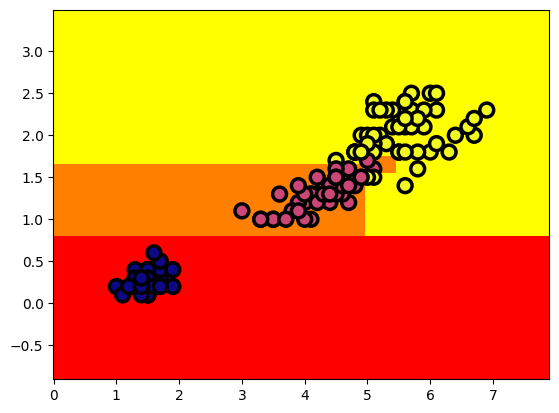

In [31]:
def getmeshgrid(data):
    
    x_min,x_max = data[:,0].min()-1,data[:,0].max()+1
    y_min,y_max = data[:,1].min()-1,data[:,1].max()+1
    
    return np.meshgrid((np.arange(x_min,x_max,0.01)),
                      (np.arange(y_min,y_max,0.01)))


clf = DecisionTreeClassifier(criterion='gini',max_depth=50)
clf.fit(petal_data,classes)
xx,yy = getmeshgrid(pt_array)

predicted = clf.predict(np.c_[xx.ravel(),yy.ravel()]).reshape(xx.shape)
plt.pcolormesh(xx,yy,predicted,cmap='autumn')
plt.scatter(pt_array[:,0],pt_array[:,1],c = classes,
           s = 100,cmap='plasma',edgecolors='black',linewidths=2.5)

In [32]:
a = [round(x,3) for x in np.linspace(0,0.05,10)]
a

[0.0, 0.006, 0.011, 0.017, 0.022, 0.028, 0.033, 0.039, 0.044, 0.05]

## 7.Sepal Data

In [33]:
clf = DecisionTreeClassifier(criterion='gini',ccp_alpha=0.025)
clf.fit(petal_data,classes)
x_min,x_max = pt_array[:,0].min()-1,pt_array[:,0].max()+1
y_min,y_max = pt_array[:,1].min()-1,pt_array[:,1].max()+1
xx,yy = np.meshgrid((np.arange(x_min,x_max,0.01)),
                      (np.arange(y_min,y_max,0.01)))
y_  = np.arange(y_min,y_max,0.01)
predicted_class = clf.predict(np.c_[xx.ravel(),yy.ravel()]).reshape(xx.shape)
trace1 = go.Heatmap(x=xx[0], y=y_, 
                    z=predicted_class,
                    colorscale='Jet',
                    showscale=True)
trace2 = go.Scatter(x = pt_array[:,0],y = pt_array[:,1],
                    mode='markers',
                    showlegend=False,
                    marker=dict(size=10,
                                color=classes, 
                                colorscale='Jet',
                                reversescale = True,
                                line=dict(color='black', width=1))
                   )

layout= go.Layout(
    autosize= True,
    title= 'Class 3 Surface Probability',
    hovermode= 'closest',
    showlegend= False)

data = [trace1,trace2]
fig3 = go.Figure(data = data,layout=layout)
py.iplot(fig3)

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



## 8.Petal Data

In [34]:
clf = DecisionTreeClassifier(criterion='gini',ccp_alpha=0.025)
clf.fit(sepal_data,classes)
x_min,x_max = sp_array[:,0].min()-1,sp_array[:,0].max()+1
y_min,y_max = sp_array[:,1].min()-1,sp_array[:,1].max()+1
xx,yy = np.meshgrid((np.arange(x_min,x_max,0.01)),
                      (np.arange(y_min,y_max,0.01)))
y_  = np.arange(y_min,y_max,0.01)
predicted_class = clf.predict(np.c_[xx.ravel(),yy.ravel()]).reshape(xx.shape)
trace1 = go.Heatmap(x=xx[0], y=y_, 
                    z=predicted_class,
                    colorscale='Jet',
                    showscale=True)
trace2 = go.Scatter(x = sp_array[:,0],y = sp_array[:,1],
                    mode='markers',
                    showlegend=False,
                    marker=dict(size=10,
                                color=classes, 
                                colorscale='Jet',
                                reversescale = True,
                                line=dict(color='black', width=1))
                   )

layout= go.Layout(
    autosize= True,
    title= 'Class 3 Surface Probability',
    hovermode= 'closest',
    showlegend= False)

data = [trace1,trace2]
fig3 = go.Figure(data = data,layout=layout)
py.iplot(fig3)

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



## 9.Decision Tree Classifier


In [35]:
params = {
        'criterion':["gini","entropy"],
        'splitter': ["best", "random"],
        'max_depth':[int(x) for x in np.linspace(1,20,5)],
        'min_samples_split':[2,4,6,8],
        'min_samples_leaf':[2,4,6,8],
        'ccp_alpha':[round(x,3) for x in np.linspace(0,0.05,10)]
    }
scores = []
clf = RandomizedSearchCV(estimator=DecisionTreeClassifier(),param_distributions=params,cv = 5,n_iter=10,n_jobs=-1,
                        return_train_score=False)
clf.fit(X_train,y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
                   param_distributions={'ccp_alpha': [0.0, 0.006, 0.011, 0.017,
                                                      0.022, 0.028, 0.033,
                                                      0.039, 0.044, 0.05],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 5, 10, 15, 20],
                                        'min_samples_leaf': [2, 4, 6, 8],
                                        'min_samples_split': [2, 4, 6, 8],
                                        'splitter': ['best', 'random']})

In [36]:
clf.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.044, criterion='entropy', max_depth=20,
                       min_samples_leaf=4, min_samples_split=8,
                       splitter='random')

In [37]:
clf.best_score_

0.9666666666666668

In [38]:
clf = DecisionTreeClassifier(ccp_alpha=0.028, criterion='entropy', max_depth=5,
                       min_samples_leaf=6)

clf.fit(X_train,y_train)
clf.score(X_train,y_train)

0.975

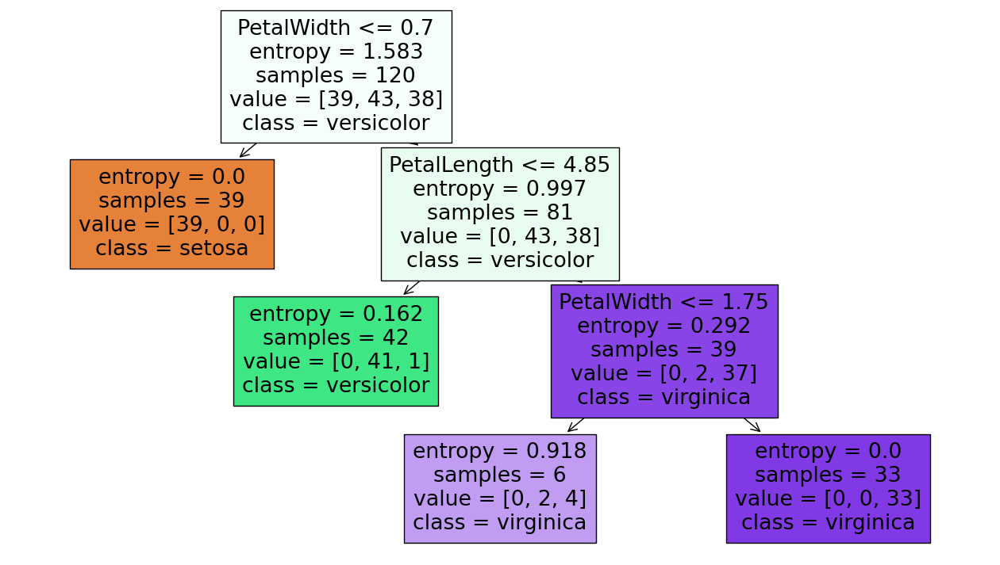

In [39]:
clf = DecisionTreeClassifier(ccp_alpha=0.028, criterion='entropy', max_depth=5,
                       min_samples_leaf=6)
clf.fit(X_train,y_train)
classnames=['setosa', 'versicolor', 'virginica']
plt.figure(figsize = (16,9))
tree.plot_tree(clf,filled=True,feature_names=train.columns,class_names=classnames)
plt.show()

In [40]:
clf.score(X_test,y_test)

0.8666666666666667

<Axes: >

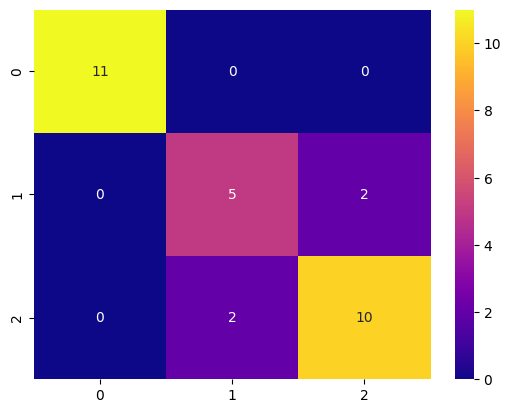

In [41]:
prediction = clf.predict(X_test)
cn = metrics.confusion_matrix(y_test,prediction)
sn.heatmap(cn,annot=True,cmap='plasma')

In [42]:
print(metrics.classification_report(y_test,prediction))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        11
           2       0.71      0.71      0.71         7
           3       0.83      0.83      0.83        12

    accuracy                           0.87        30
   macro avg       0.85      0.85      0.85        30
weighted avg       0.87      0.87      0.87        30



## 10.Testing on the Main Dataset now!!

In [43]:
iris.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth,Class
0,5.8,2.8,5.1,2.4,3
1,4.5,2.3,1.3,0.3,1
2,6.1,2.8,4.0,1.3,2
3,7.2,3.2,6.0,1.8,3
4,5.5,2.5,4.0,1.3,2


In [44]:
prediction = []
train_test = np.array(train)
for i in range(len(train_test)):
    prediction.append(clf.predict([train_test[i]]))

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

C:\Users\Manis\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with 

In [45]:
prediction = np.array(prediction)
iris['Predicted'] = prediction
iris.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth,Class,Predicted
0,5.8,2.8,5.1,2.4,3,3
1,4.5,2.3,1.3,0.3,1,1
2,6.1,2.8,4.0,1.3,2,2
3,7.2,3.2,6.0,1.8,3,3
4,5.5,2.5,4.0,1.3,2,2


In [46]:
mapper = {1:'setosa',2:'versicolor',3:'virginica'}
iris['Actual_class'] = iris['Class'].map(mapper)
iris['Predicted_class'] = iris['Predicted'].map(mapper)
iris.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth,Class,Predicted,Actual_class,Predicted_class
0,5.8,2.8,5.1,2.4,3,3,virginica,virginica
1,4.5,2.3,1.3,0.3,1,1,setosa,setosa
2,6.1,2.8,4.0,1.3,2,2,versicolor,versicolor
3,7.2,3.2,6.0,1.8,3,3,virginica,virginica
4,5.5,2.5,4.0,1.3,2,2,versicolor,versicolor


In [47]:
iris['Predicted_class'].value_counts()

virginica     51
setosa        50
versicolor    49
Name: Predicted_class, dtype: int64

<Axes: xlabel='Actual_class', ylabel='count'>

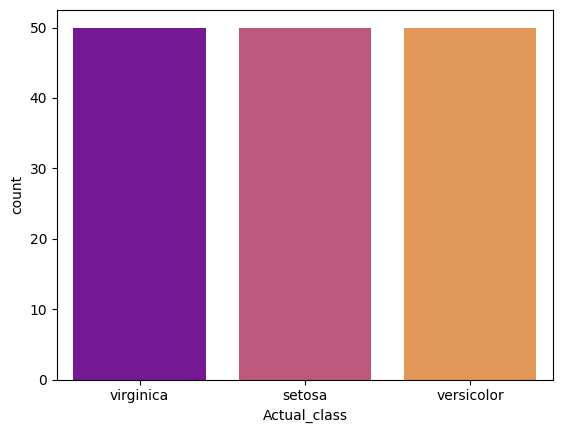

In [48]:
sn.countplot(data = iris,x = 'Actual_class',palette= 'plasma')

<Axes: xlabel='Predicted_class', ylabel='count'>

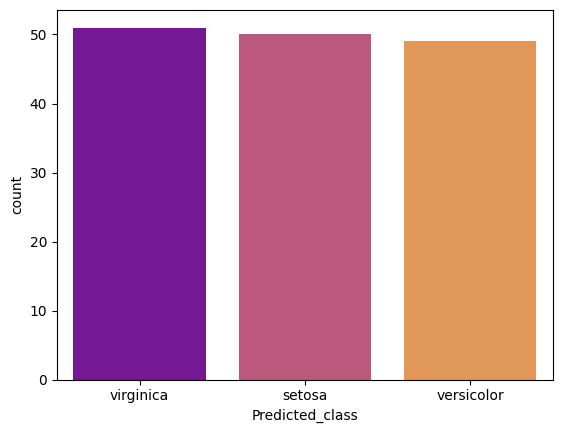

In [49]:
sn.countplot(data = iris,x = 'Predicted_class',palette= 'plasma')

<Axes: >

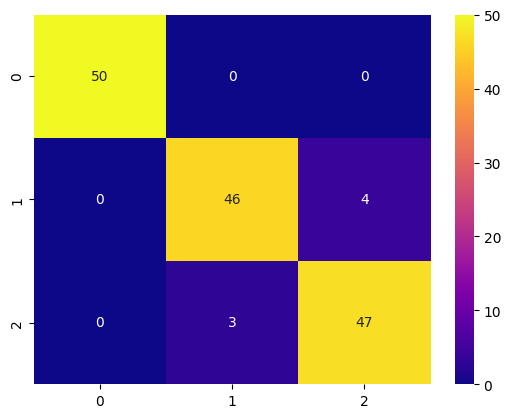

In [50]:
final_prediction = clf.predict(train)
cn = metrics.confusion_matrix(test,final_prediction)
sn.heatmap(cn,annot=True,cmap='plasma')

In [51]:
print(metrics.classification_report(test,final_prediction))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        50
           2       0.94      0.92      0.93        50
           3       0.92      0.94      0.93        50

    accuracy                           0.95       150
   macro avg       0.95      0.95      0.95       150
weighted avg       0.95      0.95      0.95       150



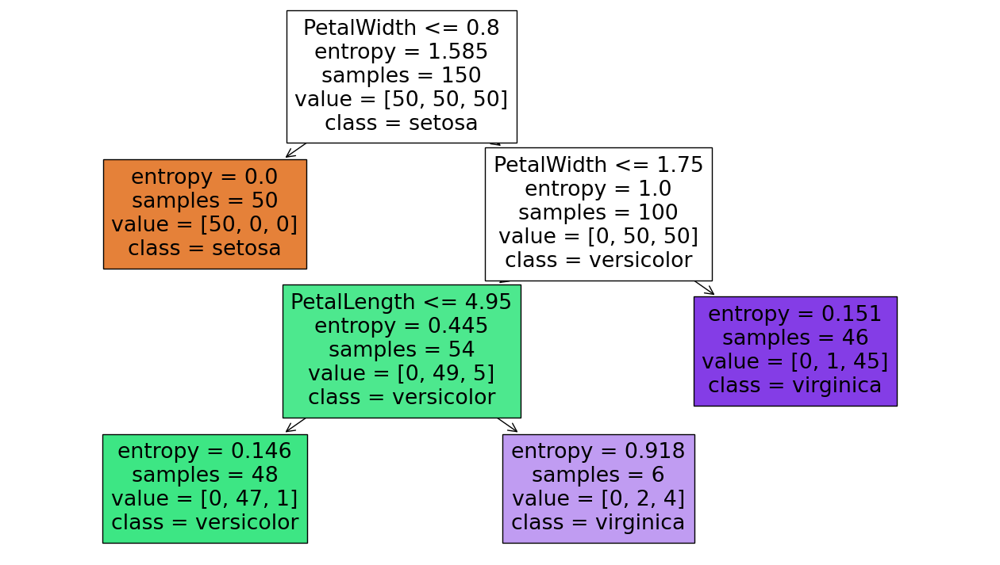

In [52]:
clf = DecisionTreeClassifier(ccp_alpha=0.028, criterion='entropy', max_depth=5,
                       min_samples_leaf=6)
clf.fit(train,test)
classnames=['setosa', 'versicolor', 'virginica']
plt.figure(figsize = (16,9))
tree.plot_tree(clf,filled=True,feature_names=train.columns,class_names=classnames)
plt.show()